In [1]:
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

file_path = 'merged_participant_data.json'

with open(file_path, 'r') as file:
    data = json.load(file)


# Now you can work with the un-JSONed data
# For example, you can access specific values using keys
# print(data)

In [2]:
len(data['participants'])

53

In [3]:
data

{'participants': [{'metadata': {'consent': 'on',
    'participant_number': '18',
    'gender': 'female',
    'age': '26-30',
    'education': 'University master',
    'experience': 'Used it many times',
    'version_sequence': ['version3', 'version4', 'version2', 'version1'],
    'dataset_sequence': ['dataset3', 'dataset4', 'dataset2', 'dataset1'],
    'run_id': 4,
    'uuid': '05aa8793-58bc-47ff-8de7-3303ec0bbe08'},
   'log_version1': [[{'sequenceID': 1,
      'source': 'trueAnomaly',
      'event': 'anomaly',
      'block': {'id': 63,
       'xpos': 60,
       'colorID': 2,
       'eventCat': '10',
       'inititialTime': '2024-04-22T14:22:47.346Z',
       'detectionTime': '2024-04-22T14:22:47.346Z'}}],
    [{'sequenceID': 11,
      'source': 'trueAnomaly',
      'event': 'anomaly',
      'block': {'id': 63,
       'xpos': 60,
       'colorID': 2,
       'eventCat': '10',
       'inititialTime': '2024-04-22T14:22:47.377Z',
       'detectionTime': '2024-04-22T14:22:47.377Z'}}],
    [{

In [4]:
new_data = data['participants'][6]

In [5]:
print(new_data['metadata']['participant_number'])

63


### Data structured in dataframe

In [6]:
def preprocessing(log_version, data):
  log_version_data = data[log_version]

  # Flatten the nested lists
  flattened_data = [item for sublist in log_version_data for item in sublist]

  df = pd.json_normalize(flattened_data)
  df.rename(columns={'block.id': 'id'}, inplace=True)
  df.rename(columns={'block.xpos': 'xpos'}, inplace=True)
  df.rename(columns={'block.colorID': 'colorID'}, inplace=True)
  df.rename(columns={'block.eventCat': 'eventCat'}, inplace=True)
  df.rename(columns={'block.inititialTime': 'inititialTime'}, inplace=True)
  df.rename(columns={'block.detectionTime': 'detectionTime'}, inplace=True)

  # Assuming 'df' is your dataframe
  df['inititialTime'] = pd.to_datetime(df['inititialTime'])
  df['detectionTime'] = pd.to_datetime(df['detectionTime'])

  # Now you can compute the reaction time as the difference
  df['reactionTime'] = df['detectionTime'] - df['inititialTime']

  # To convert the reaction time from a timedelta to a more usable format (e.g., seconds)
  df['reactionTime_seconds'] = df['reactionTime'].dt.total_seconds()

  #remove the rows where sequenceID is NaN
  df = df.dropna(subset=['sequenceID'])

  return df

In [7]:
df = preprocessing('log_version3', new_data)
df

,sequenceID,source,event,windowLength,id,xpos,colorID,eventCat,inititialTime,detectionTime,oldWindowLength,reactionTime,reactionTime_seconds
0,1.0,detector,anomalyDetected,10.0,61.0,60.0,1.0,1,2024-04-22 15:46:37.864000+00:00,2024-04-22 15:46:37.864000+00:00,NaN,0 days 00:00:00,0.000
1,8.0,detector,anomalyDetected,10.0,61.0,60.0,1.0,1,2024-04-22 15:46:37.868000+00:00,2024-04-22 15:46:37.868000+00:00,NaN,0 days 00:00:00,0.000
2,9.0,detector,anomalyDetected,10.0,61.0,60.0,1.0,1,2024-04-22 15:46:37.868000+00:00,2024-04-22 15:46:37.869000+00:00,NaN,0 days 00:00:00.001000,0.001
3,0.0,detector,anomalyDetected,10.0,63.0,60.0,1.0,1,2024-04-22 15:46:40.857000+00:00,2024-04-22 15:46:40.857000+00:00,NaN,0 days 00:00:00,0.000
4,4.0,trueAnomaly,anomaly,NaN,63.0,60.0,2.0,10,2024-04-22 15:46:40.859000+00:00,2024-04-22 15:46:40.859000+00:00,NaN,0 days 00:00:00,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,4.0,user,markAsAnomaly,4.0,203.0,29.0,2.0,10,2024-04-22 15:50:10.859000+00:00,2024-04-22 15:50:57.113000+00:00,5.0,0 days 00:00:46.254000,46.254
207,2.0,detector,anomalyDetected,7.0,235.0,60.0,2.0,2,2024-04-22 15:50:58.863000+00:00,2024-04-22 15:50:58.863000+00:00,NaN,0 days 00:00:00,0.000
208,4.0,detector,anomalyDetected,4.0,235.0,60.0,2.0,2,2024-04-22 15:50:58.864000+00:00,2024-04-22 15:50:58.864000+00:00,NaN,0 days 00:00:00,0.000
209,6.0,user,confirmAnomaly,10.0,212.0,36.0,2.0,10,2024-04-22 15:50:24.378000+00:00,2024-04-22 15:50:59.750000+00:00,10.0,0 days 00:00:35.372000,35.372


### Last interaction with event (no detector data))

In [8]:
# returns a dataframe with all last clicks of the participant

def last_click_to_df(df):

  marked_an_unmarked_clicks = df[(df['source'] == 'user') & ((df['event'] == 'confirmAnomaly') | (df['event'] == 'unmarkAnomaly') | (df['event'] == 'markAsAnomaly'))]
  marked_an_unmarked_clicks = marked_an_unmarked_clicks.sort_values(by =['sequenceID','id','detectionTime'])	

  # i want to remove the rows of drop_duplicates from the marked_an_unmarked_clicks
  no_duplicated_clicks = marked_an_unmarked_clicks.drop_duplicates(subset=['sequenceID', 'id'], keep='last')

  return no_duplicated_clicks

In [9]:
checking = last_click_to_df(df)
checking
average_reaction_time = checking['reactionTime_seconds'].mean()
average_reaction_time

35.74654

### True anomalies in dataframe

In [10]:
def anomalies_to_df(df):
  anomalies = df[df['event'] == 'anomaly']
  anomalies = anomalies[['sequenceID', 'id', 'eventCat']]
  sorted_anomalies = anomalies.sort_values(by=['sequenceID', 'id'])
  sorted_anomalies.reset_index(drop=True, inplace=True)

  return sorted_anomalies
  

### accuracy per version of participant

### Metrics

In [11]:
def confusion_matrix(last_click, anomalies):
    # Unmarked clicks eruit gehaald
    last_click_archive = last_click.copy()
    reactionTime = last_click['reactionTime_seconds'].mean()
    reactionTime = round(reactionTime, 3)

    last_click = last_click[last_click['event'] != 'unmarkAnomaly']
    last_click = last_click[['sequenceID', 'id']]
    last_click.reset_index(drop=True, inplace=True)

    # Anomaly frame
    anomalies['is_detected'] = anomalies.apply(lambda row: (row['sequenceID'], row['id']) in zip(last_click['sequenceID'], last_click['id']), axis=1)

    TP = anomalies[anomalies['is_detected'] == True]
    FN = anomalies[anomalies['is_detected'] == False]

    # I want to merge the column 'reactionTime_seconds' of last_click with the anomalies df
    TP_reaction_time_df = TP.merge(last_click_archive, on=['sequenceID', 'id'])
    TP_reaction_time = TP_reaction_time_df['reactionTime_seconds'].mean()
    TP_reaction_time = round(TP_reaction_time, 3)

    FP = last_click[~last_click.apply(lambda row: (row['sequenceID'], row['id']) in zip(TP['sequenceID'], TP['id']), axis=1)]

    F1 = 2 * len(TP) / (2 * len(TP) + len(FP) + len(FN))
    F1 = round(F1, 3)

    Precision = round(len(TP) / (len(TP) + len(FP)), 3)
    Recall = round(len(TP) / (len(TP) + len(FN)), 3)

    return {
        'TP': len(TP),
        'FN': len(FN),
        'FP': len(FP),
        'F1': F1,
        'Precision': Precision,
        'Recall': Recall,
        'reactionTime': reactionTime,
        'TP_reactionTime': TP_reaction_time
    }


In [12]:
checken = confusion_matrix(last_click_to_df(df), anomalies_to_df(df))
checken

{'TP': 31,
 'FN': 5,
 'FP': 0,
 'F1': 0.925,
 'Precision': 1.0,
 'Recall': 0.861,
 'reactionTime': 35.747,
 'TP_reactionTime': 34.978}

In [13]:
def score_per_version_per_participant(participant_data, metric_id = 'F1', sort=True):
  
  version_sequence = participant_data['metadata']['version_sequence']
  new_dict = {}
  for i in range(4):
    df = preprocessing(f'log_version{i+1}', participant_data)
    metric = confusion_matrix(last_click_to_df(df), anomalies_to_df(df))
    new_dict[version_sequence[i]] = metric[metric_id]

  df_metric = pd.DataFrame(list(new_dict.items()), columns=['version', metric_id])
  if sort == True:
    df_metric.sort_values('version', inplace=True)
  df_metric['version_name'] = ['window', 'history', 'window+ad', 'history+ad']
  metric_dict = {row['version_name']: round(row[metric_id], 2) for _, row in df_metric.iterrows()}
  participant_metric_dict = {participant_data['metadata']['participant_number']: metric_dict}

  return participant_metric_dict

In [14]:
checken_2 = score_per_version_per_participant(new_data, 'F1') #TP, FN, FP, F1, Precision, Recall, reactionTime, TP_reactionTime
checken_2

{'63': {'window': 0.93, 'history': 0.94, 'window+ad': 0.86, 'history+ad': 1.0}}

In [15]:
def all_participants_score(data, metric_id = 'F1', sort=True):

    data_dict = {}

    for participant in data['participants']:
        score_dict_for_participant = score_per_version_per_participant(participant.copy(), metric_id, sort)
        data_dict.update(score_dict_for_participant)


    # Convert the dictionary to a list of dictionaries, with 'participant' as a key
    formatted_data = []
    for participant, values in data_dict.items():
        row = {'participant': int(participant)}
        row.update(values)
        formatted_data.append(row)

    # Create the DataFrame
    score_per_version = pd.DataFrame(formatted_data)

    score_per_version = score_per_version[score_per_version['participant'] != 11]
    score_per_version = score_per_version[score_per_version['participant'] != 42]

    #recet the index
    score_per_version.reset_index(drop=True, inplace=True)



    # score_for_all = []
    # score_per_version = pd.DataFrame(columns=['window', 'history', 'window+ad', 'history+ad'])

    # for participant in data['participants']:
    #     score_dict_for_participant = score_per_version_per_participant(participant.copy(), metric_id, sort)
    #     score_for_all.append(score_dict_for_participant)
    #     score_values = list(score_dict_for_participant.values())[0]
    #     score_per_version = pd.concat([score_per_version, pd.DataFrame(score_values, index=[0])], ignore_index=True)

    return score_per_version

In [16]:
checken_3 = all_participants_score(data, 'reactionTime') #TP, FN, FP, F1, Precision, Recall, reactionTime, TP_reactionTime
checken_3

,participant,window,history,window+ad,history+ad
0,18,11.68,41.77,20.40,6.50
1,43,12.00,26.19,13.87,33.87
2,51,28.08,24.26,15.80,16.63
3,12,27.88,17.62,23.83,33.58
4,52,44.59,45.92,35.73,40.76
5,63,35.75,24.63,27.11,18.63
6,44,16.81,21.35,38.31,32.87
7,32,11.49,29.61,33.12,20.06
8,27,19.95,42.10,45.14,45.63
9,47,17.47,14.14,8.17,13.90


In [17]:
def plot_all_participants_average_std(data, metric_id = 'F1', sort = True):
    score_per_version = all_participants_score(data, metric_id, sort)
    score_per_version['std'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].std(axis=1)
    score_per_version['average'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].mean(axis=1)
    #score_per_version['participant'] = range(1, len(score_per_version) + 1)
    score_per_version_sorted_by_average = score_per_version.sort_values('average', ascending=False)    

    
    #i want to plot the average per participant and the standard deviation in the same plot
    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(15, 10))
    ax = sns.barplot(x=score_per_version.index, y='average', data=score_per_version_sorted_by_average, color='lightblue')
    ax.errorbar(x=score_per_version.index, y=score_per_version_sorted_by_average['average'], yerr=score_per_version_sorted_by_average['std'], fmt='o', color='black')
    ax.set_xticklabels(score_per_version_sorted_by_average['participant'])
    ax.set_title(f'Participant {metric_id} per version average and standard deviation')
    ax.set_xlabel('Participant')
    ax.set_ylabel('average ' + metric_id)
    plt.show()


In [18]:
def average_of_average(data, metric_id = 'F1', sort=True):
    score_per_version = all_participants_score(data, metric_id, sort)
    score_per_version['min'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].min(axis=1)
    score_per_version['max'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].max(axis=1)
    score_per_version['average'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].mean(axis=1)

    average = score_per_version['average'].mean()
    average = round(average, 2)
    average_min = score_per_version['min'].mean()
    average_min = round(average_min, 2)
    average_max = score_per_version['max'].mean()
    average_max = round(average_max, 2)
    
    return {'average': average, 'min': average_min, 'max': average_max}


In [19]:
averages = average_of_average(data, 'F1')
averages

{'average': 0.66, 'min': 0.52, 'max': 0.79}

In [20]:


def plot_all_participants_average_min_max(data, metric_id = 'F1', sort=True):
    score_per_version = all_participants_score(data, metric_id, sort)
    score_per_version['min'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].min(axis=1)
    score_per_version['max'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].max(axis=1)
    score_per_version['average'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].mean(axis=1)
    #score_per_version['participant'] = range(1, len(score_per_version) + 1)
    score_per_version_sorted_by_average = score_per_version.sort_values('average', ascending=False) 

    #i want to plot the average per participant and the standard deviation in the same plot
    #sns.set_theme(style="whitegrid")
    plt.figure(figsize=(15, 10))
    ax = sns.barplot(x=score_per_version.index, y='average', data=score_per_version_sorted_by_average, color='lightblue')
    ax.errorbar(x=score_per_version.index, y=score_per_version_sorted_by_average['average'], yerr=[score_per_version_sorted_by_average['average'] - score_per_version_sorted_by_average['min'], score_per_version_sorted_by_average['max'] - score_per_version_sorted_by_average['average']], fmt='o', color='black')
    # ax.set_xticklabels(score_per_version_sorted_by_average['participant'])
    ax.set_title(f'Participant {metric_id} per version average and min max', fontsize=20)
    ax.set_xlabel('Participant', fontsize=20)
    ax.set_ylabel('average ' + metric_id, fontsize=20)
    plt.savefig('score_min_max.png')
    plt.show()

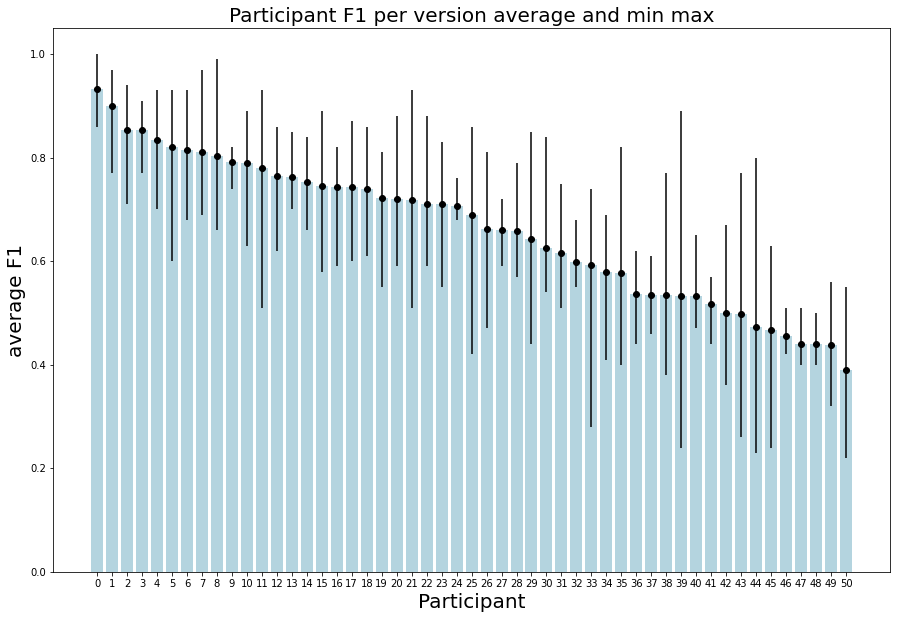

In [21]:
checken_4 = plot_all_participants_average_min_max(data, 'F1', True) #TP, FN, FP, F1, Precision, Recall, reactionTime, TP_reactionTime
checken_4

In [22]:
import plotly.express as px

def plot_parallel_coordinates(data, metric_id = 'F1', sort=True):
    score_per_version = all_participants_score(data, metric_id, sort)
    score_per_version['average'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].mean(axis=1)
    #score_per_version['participant'] = range(1, len(score_per_version) + 1)
    score_per_version_sorted_by_average = score_per_version.sort_values('average', ascending=False) 

    custom_color_scale = [[0, 'fuchsia'], [0.5, 'orange'], [1, 'aqua']]


    fig = px.parallel_coordinates(score_per_version_sorted_by_average, color="average",
                              dimensions=['window', 'history', 'window+ad', 'history+ad'],
                              # all y axes should have 0 in the middle
                              color_continuous_scale= custom_color_scale, # px.colors.sequential.Plasma,
                              color_continuous_midpoint=score_per_version_sorted_by_average['average'].mean())


    fig.show()
    

In [23]:
import plotly.express as px

def plot_parallel_coordinates(data, metric_id='F1', sort=True):
    score_per_version = all_participants_score(data, metric_id, sort)
    score_per_version['average'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].mean(axis=1)
    score_per_version_sorted_by_average = score_per_version.sort_values('average', ascending=False) 

    custom_color_scale = [[0, 'fuchsia'], [0.5, 'orange'], [1, 'aqua']]

    fig = px.parallel_coordinates(
        score_per_version_sorted_by_average, 
        color="average",
        dimensions=['window', 'history', 'window+ad', 'history+ad'],
        color_continuous_scale=custom_color_scale,
        color_continuous_midpoint=score_per_version_sorted_by_average['average'].mean()
    )

    # Manually set the range for each dimension
    for dim in fig.data[0]['dimensions']:
        dim['range'] = [0.2, 1]

    # Update layout to add a title, increase text size, and adjust margins and height
    fig.update_layout(
        title={
            'text': f'Parallel Coordinates Plot for {metric_id}',
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': {'size': 30}
        },
        font=dict(size=18),  # Increase the default font size
        margin=dict(t=160),  # Adjust top margin to create space for the title
        height=800  # Set the height of the figure
    )

    fig.show()
    # Save the figure to a file
    #fig.write_image("parallel_coordinates.png")

# Example call to the function
# plot_parallel_coordinates(data)



In [24]:
nog_eens_checken = plot_parallel_coordinates(data, 'F1', True) #TP, FN, FP, F1, Precision, Recall, reactionTime, TP_reactionTime
nog_eens_checken

In [25]:


import plotly.express as px

def plot_parallel_coordinates_baseline(data, metric_id='F1', sort=True):
    score_per_version = all_participants_score(data, metric_id, sort)
    score_per_version['average'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].mean(axis=1)
    score_per_version['baseline'] = 0
    score_per_version['standardized_history'] = (score_per_version['history'] - score_per_version['window']) / score_per_version['window']
    score_per_version['standardized_window+ad'] = (score_per_version['window+ad'] - score_per_version['window']) / score_per_version['window']
    score_per_version['standardized_history+ad'] = (score_per_version['history+ad'] - score_per_version['window']) / score_per_version['window']
    #score_per_version['participant'] = range(1, len(score_per_version) + 1)
    score_per_version_sorted_by_average = score_per_version.sort_values('average', ascending=False)

    custom_color_scale = [[0, 'fuchsia'], [0.5, 'orange'], [1, 'aqua']]

    dimensions = [
        dict(label='baseline', values=score_per_version_sorted_by_average['baseline'], range=[-1, 3]),
        dict(label='standardized_history', values=score_per_version_sorted_by_average['standardized_history'], range=[-1, 3]),
        dict(label='standardized_window+ad', values=score_per_version_sorted_by_average['standardized_window+ad'], range=[-1, 3]),
        dict(label='standardized_history+ad', values=score_per_version_sorted_by_average['standardized_history+ad'], range=[-1, 3])
    ]

    fig = px.parallel_coordinates(score_per_version_sorted_by_average, color="average",
                                  dimensions=dimensions,
                                  color_continuous_scale=custom_color_scale,
                                  color_continuous_midpoint=0.5)
    
    fig.update_layout(
        title={
            'text': f'Parallel Coordinates Plot for {metric_id}',
            'x': 0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': {'size': 30}
        },
        font=dict(size=18),  # Increase the default font size
        margin=dict(t=160),  # Adjust top margin to create space for the title
        height=800  # Set the height of the figure
    )

    fig.show()



In [26]:
import plotly.graph_objects as go

def plot_parallel_coordinates_baseline_2(data, metric_id='F1', sort=True):
    score_per_version = all_participants_score(data, metric_id, sort)
    score_per_version['average'] = score_per_version[['window', 'history', 'window+ad', 'history+ad']].mean(axis=1)
    score_per_version['baseline'] = 0
    score_per_version['normalized_history'] = (score_per_version['history'] - score_per_version['window']) / score_per_version['window']
    score_per_version['normalized_window+ad'] = (score_per_version['window+ad'] - score_per_version['window']) / score_per_version['window']
    score_per_version['normalized_history+ad'] = (score_per_version['history+ad'] - score_per_version['window']) / score_per_version['window']
    #score_per_version['participant'] = range(1, len(score_per_version) + 1)
    score_per_version_sorted_by_average = score_per_version.sort_values('average', ascending=False)

    df=score_per_version_sorted_by_average

    custom_color_scale = [[0, 'fuchsia'], [0.5, 'orange'], [1, 'aqua']]

    fig = go.Figure(data=
        go.Parcoords(
            line = dict(color = df['average'],
                        colorscale = custom_color_scale,
                        showscale = True,
                        cmin = 0,
                        cmax = 1),
            dimensions = list([
                dict(range = [-1,3],
                     label = 'baseline', values = df['baseline']),
                dict(range = [-1,3],
                     label = 'normalized_history', values = df['normalized_history']),
                dict(range = [-1,3],
                     label = 'normalized_window+ad', values = df['normalized_window+ad']),
                dict(range = [-1,3],
                     label = 'normalized_history+ad', values = df['normalized_history+ad'])
            ])
        )
    )

    fig.show()




In [27]:
prallel_plot = plot_parallel_coordinates_baseline_2(data, 'F1', True) #TP, FN, FP, F1, Precision, Recall, reactionTime, TP_reactionTime
prallel_plot

In [28]:
# testen_2 = plot_all_participants_average_min_max(data, 'F1')

In [29]:
# tester = plot_all_participants_average_std(data, 'F1')

In [30]:
def plot_all_participants_score(data, metric_id = 'F1', sort=True):
    score_per_version = all_participants_score(data, metric_id, sort)
    #score_per_version['participant'] = range(1, len(score_per_version) + 1)
    score_per_version = score_per_version.melt(id_vars='participant', var_name='version', value_name=metric_id)

    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(15, 10))
    ax = sns.barplot(x='participant', y=metric_id, hue='version', data=score_per_version)
    ax.set_title(f'Participant {metric_id} per version')
    ax.set_xlabel('Participant')
    ax.set_ylabel(metric_id)
    plt.show()

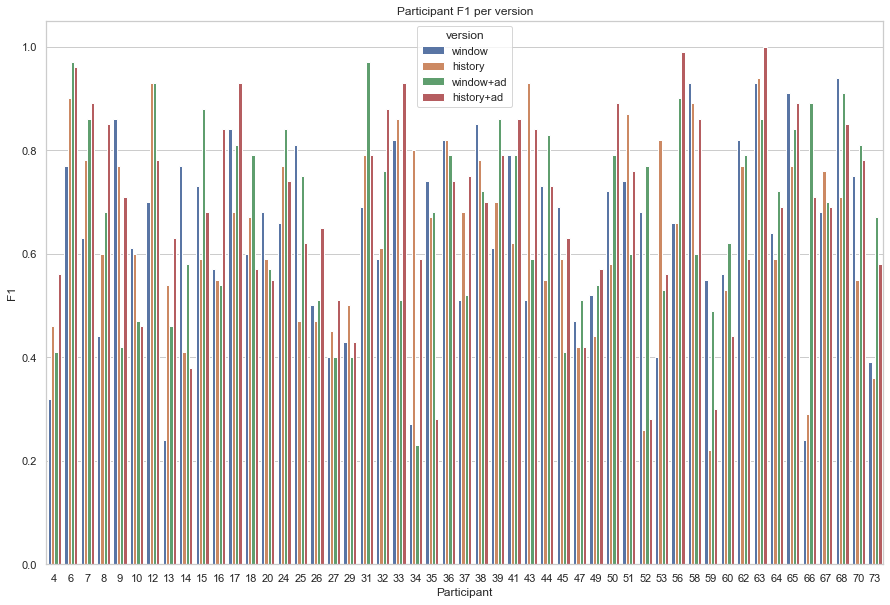

In [31]:
per_participant_score = plot_all_participants_score(data, 'F1', sort=True) #TP, FN, FP, F1, Precision, Recall, reactionTime, TP_reactionTime	

In [32]:
def violin_plot(data):
    plt.figure(figsize=(20,10))

    data = data.drop(columns=['participant'])

    sns.set()
    sns.set_theme(style="whitegrid")


    # Create the violin plot
    sns.violinplot(data, cut=0, palette="Set2")

    # Set the labels and title
    plt.ylabel('F1', fontsize=18)
    plt.title('distribution of F1 score per visualization', fontsize=20)
    #make the plot bigger

    # Increase the text size of the x-axis tick labels (categories)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=15)

    # Show the plot
    plt.show()

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def violin_plot(data, metric):
    plt.figure(figsize=(20, 10))

    data = data.drop(columns=['participant'])

    sns.set()
    sns.set_theme(style="whitegrid")

    # Create the violin plot
    sns.violinplot(data=data, cut=0, palette="Set2", inner=None)

    # Overlay the boxplot
    sns.boxplot(data=data, width=0.1, showcaps=True, boxprops={'zorder':2})

    # Set the labels and title
    plt.ylabel('seconds', fontsize=18)
    plt.title(f'Distribution of {metric} Score per Visualization', fontsize=20)

    # Increase the text size of the x-axis tick labels (categories)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=15)

    # Show the plot
    plt.show()


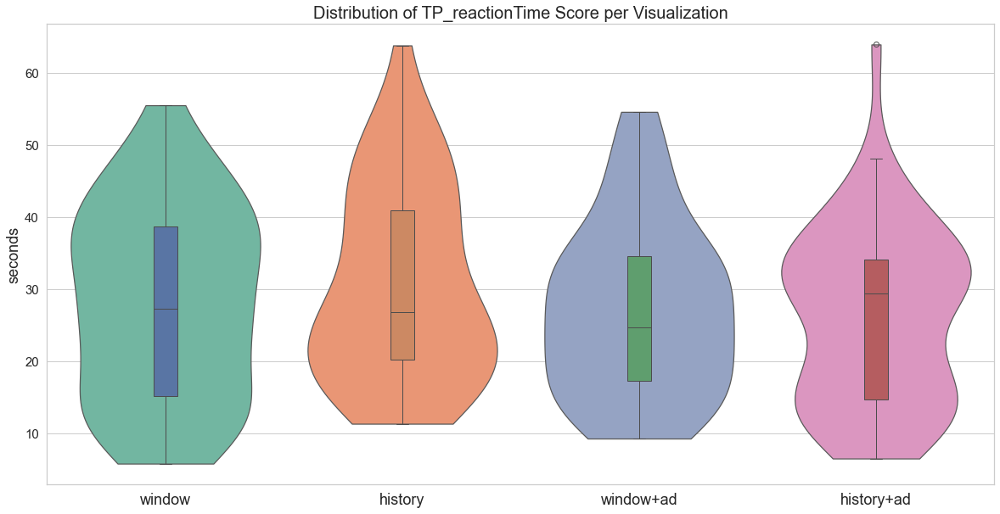

In [60]:
violin_plot_all_participants = violin_plot(all_participants_score(data, 'TP_reactionTime', sort=True), 'TP_reactionTime') #TP, FN, FP, F1, Precision, Recall, reactionTime, TP_reactionTime	

In [35]:
def box_plot(data):
    plt.figure(figsize=(20,10))

    data = data.drop(columns=['participant'])

    # Create the box plot
    sns.boxplot(data, orient= 'h', palette="Set2")

    # Set the labels and title
    plt.xlabel('List')
    plt.ylabel('Values')
    plt.title('Box Plot')

    # Show the plot
    plt.show()

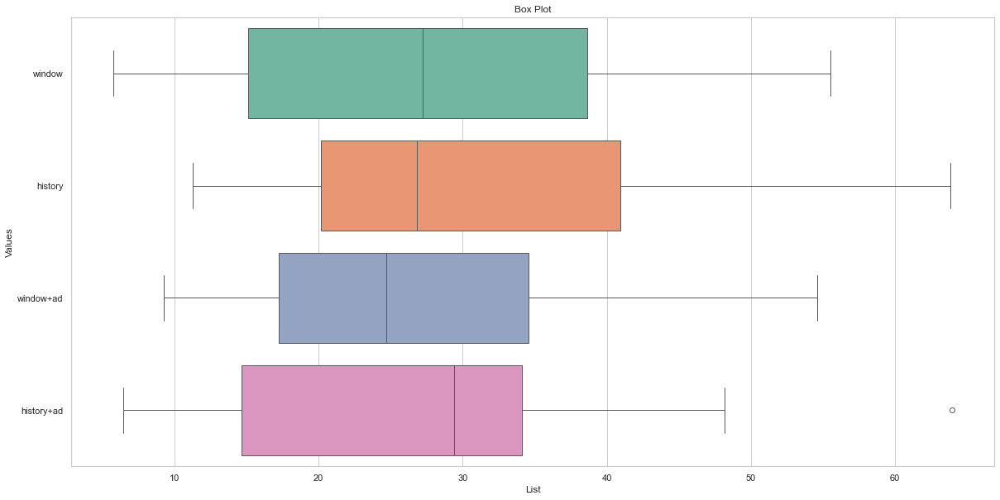

In [36]:
bosplotje = box_plot(all_participants_score(data, 'TP_reactionTime', sort=True))

### All scores to csv

In [37]:
score_recall = all_participants_score(data, 'Recall', True)
score_precision = all_participants_score(data, 'Precision', True)
score_F1 = all_participants_score(data, 'F1', True)
score_TP = all_participants_score(data, 'TP', True)
score_FN = all_participants_score(data, 'FN', True)
score_FP = all_participants_score(data, 'FP', True)

In [38]:
score_F1
#score_FP.to_csv('score_FP.csv', index=False)

,participant,window,history,window+ad,history+ad
0,18,0.60,0.67,0.79,0.57
1,43,0.51,0.93,0.59,0.84
2,51,0.74,0.87,0.60,0.76
3,12,0.70,0.93,0.93,0.78
4,52,0.68,0.26,0.77,0.28
5,63,0.93,0.94,0.86,1.00
6,44,0.73,0.55,0.83,0.73
7,32,0.59,0.61,0.76,0.88
8,27,0.40,0.45,0.40,0.51
9,47,0.47,0.42,0.51,0.42


In [39]:
def flatten_all_metrics(score_recall, score_precision, score_F1, score_TP, score_FN, score_FP):
  scorelist = [score_precision, score_F1, score_TP, score_FN, score_FP]
  score_names = {'precision': score_precision, 'F1': score_F1, 'TP': score_TP, 'FN': score_FN, 'FP': score_FP}

  # Flatten the dataframe
  #score_recall['participant'] = range(1, len(score_recall) + 1)
  df_melted = score_recall.melt(id_vars=['participant'], var_name='version', value_name='recall')

  def get_key_from_value(dictionary, value):
    for key, val in dictionary.items():
      if val is value:
        return key
    return None

  for score in scorelist:
    name = get_key_from_value(score_names, score)
    #score['participant'] = range(1, len(score) + 1)
    df_melted_second = score.melt(id_vars=['participant'], var_name='version', value_name=name)
    df_melted = pd.merge(df_melted, df_melted_second, on=['participant', 'version'])

  return df_melted


In [40]:
score_FP

,participant,window,history,window+ad,history+ad
0,18,37,4,2,45
1,43,40,1,43,0
2,51,0,2,4,3
3,12,12,0,2,3
4,52,9,4,2,7
5,63,0,0,0,0
6,44,11,33,5,7
7,32,43,21,5,2
8,27,43,47,29,38
9,47,39,39,22,32


In [41]:
df_melted = flatten_all_metrics(score_recall, score_precision, score_F1, score_TP, score_FN, score_FP)

In [42]:
df_melted

,participant,version,recall,precision,F1,TP,FN,FP
0,18,window,0.86,0.46,0.60,31,5,37
1,43,window,0.72,0.39,0.51,26,10,40
2,51,window,0.58,1.00,0.74,21,15,0
3,12,window,0.72,0.68,0.70,26,10,12
4,52,window,0.64,0.72,0.68,23,13,9
...,...,...,...,...,...,...,...,...
199,64,history+ad,0.58,0.84,0.69,21,15,4
200,66,history+ad,0.69,0.73,0.71,25,11,9
201,14,history+ad,0.31,0.50,0.38,11,25,11
202,73,history+ad,0.72,0.48,0.58,26,10,28


In [43]:
#df_melted.to_csv('all_metrics.csv', index=False)

### Statistical analysis

In [44]:
score = all_participants_score(data, 'reactionTime', True)

In [45]:
from scipy.stats import f_oneway

# Assuming accuracy_per_version is your DataFrame containing the data
# You can extract the columns you want to compare
window_data = score['window']
history_data = score['history']
window_ad_data = score['window+ad']
history_ad_data = score['history+ad']

# Perform ANOVA
f_statistic, p_value = f_oneway(window_data, history_data, window_ad_data, history_ad_data)

print("F-Statistic:", f_statistic)
print("p-value:", p_value)


F-Statistic: 1.3043390097310732
p-value: 0.2741660922175321


In [46]:
import pandas as pd
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Assuming accuracy_per_version is your DataFrame containing the data
# Extract the columns you want to compare
window_data = score['window']
history_data = score['history']
window_ad_data = score['window+ad']
history_ad_data = score['history+ad']

# Perform ANOVA
f_statistic, p_value = f_oneway(window_data, history_data, window_ad_data, history_ad_data)

print("ANOVA F-Statistic:", f_statistic)
print("ANOVA p-value:", p_value)

# Create a combined DataFrame for Tukey's HSD test
data_2 = pd.DataFrame({
    'window': window_data,
    'history': history_data,
    'window_ad': window_ad_data,
    'history_ad': history_ad_data
})

# Melt the DataFrame for Tukey's test
melted_data = data_2.melt(var_name='version', value_name='metric')

melted_data

# Perform Tukey's HSD test
tukey_results = pairwise_tukeyhsd(endog=melted_data['metric'], groups=melted_data['version'], alpha=0.05)

print(tukey_results)



ANOVA F-Statistic: 1.3043390097310732
ANOVA p-value: 0.2741660922175321
    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
  group1     group2   meandiff p-adj   lower   upper  reject
------------------------------------------------------------
   history history_ad  -4.9935 0.2066 -11.5924 1.6053  False
   history     window  -2.7741 0.6966   -9.373 3.8247  False
   history  window_ad   -3.071  0.624  -9.6698 3.5279  False
history_ad     window   2.2194 0.8197  -4.3795 8.8183  False
history_ad  window_ad   1.9225 0.8745  -4.6763 8.5214  False
    window  window_ad  -0.2969 0.9994  -6.8957  6.302  False
------------------------------------------------------------


In [47]:
#score['participant'] = score.index
# score

In [48]:
# Flatten the dataframe
flattened_df = score.melt(var_name='version', value_name='metric', id_vars='participant')

# Reorder the columns
flattened_df = flattened_df[['participant', 'version', 'metric']]

# Print the flattened dataframe
flattened_df.sort_values('participant', inplace=True)
flattened_df

#flattened_df.to_csv('flattened_TP_reactionTime.csv', index=False)

,participant,version,metric
117,4,window+ad,50.65
15,4,window,41.52
66,4,history,47.84
168,4,history+ad,39.45
174,6,history+ad,15.20
...,...,...,...
127,70,window+ad,43.02
202,73,history+ad,42.33
151,73,window+ad,55.94
49,73,window,51.28


In [49]:
flattened_df = flattened_df[flattened_df['participant'] !=  11]
flattened_df = flattened_df[flattened_df['participant'] !=  42]

In [50]:
import pandas as pd
import pingouin as pg

# # Reshape the DataFrame into long format
# accuracy_long = accuracy_per_version.melt(var_name='condition', value_name='accuracy')
# accuracy_long

# Perform repeated measures ANOVA
rm_anova = pg.rm_anova(data=flattened_df, dv='metric', within='version', subject='participant')

# Print the ANOVA table
rm_anova



,Source,ddof1,ddof2,F,p-unc,ng2,eps
0,version,3,150,2.171978,0.093711,0.01919,0.919086


In [51]:

# Perform repeated measures ANOVA
rm_anova = pg.rm_anova(data=flattened_df, dv='metric', within='version', subject='participant')

# Print ANOVA results
# print(rm_anova)

# Perform pairwise comparisons with Bonferroni correction
posthoc = pg.pairwise_ttests(data=flattened_df, dv='metric', within='version', subject='participant', parametric=True, padjust='bonferroni')

# Print pairwise comparison results
posthoc


C:\Users\s152296\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pingouin\pairwise.py:28: UserWarning:

pairwise_ttests is deprecated, use pairwise_tests instead.



,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,version,history,history+ad,True,True,2.412789,50.0,two-sided,0.019540,0.117238,bonferroni,2.108,0.383985
1,version,history,window,True,True,1.413501,50.0,two-sided,0.163704,0.982226,bonferroni,0.388,0.206115
2,version,history,window+ad,True,True,1.482341,50.0,two-sided,0.144525,0.867152,bonferroni,0.425,0.231805
3,version,history+ad,window,True,True,-1.067835,50.0,two-sided,0.290724,1.000000,bonferroni,0.261,-0.175248
4,version,history+ad,window+ad,True,True,-1.213713,50.0,two-sided,0.230560,1.000000,bonferroni,0.304,-0.154546
5,version,window,window+ad,True,True,0.146254,50.0,two-sided,0.884309,1.000000,bonferroni,0.154,0.022987


In [52]:
import statsmodels.api as sm
from statsmodels.formula.api import mixedlm
from statsmodels.stats.multicomp import MultiComparison
from scipy.stats import ttest_ind


# Perform repeated measures ANOVA
model = mixedlm("metric ~ version", flattened_df, groups=flattened_df["participant"])
result = model.fit()
print(result.summary())

# Perform pairwise comparisons with Bonferroni correction
mc = MultiComparison(flattened_df['metric'], flattened_df['version'])
tb1, a1, a2 = mc.allpairtest(testfunc= ttest_ind,method='bonf')
print(tb1)
# result = mc.tukeyhsd()
# print(result.summary())


             Mixed Linear Model Regression Results
Model:               MixedLM    Dependent Variable:    metric   
No. Observations:    204        Method:                REML     
No. Groups:          51         Scale:                 99.3475  
Min. group size:     4          Log-Likelihood:        -783.9560
Max. group size:     4          Converged:             Yes      
Mean group size:     4.0                                        
----------------------------------------------------------------
                      Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept             32.120    1.801 17.834 0.000 28.590 35.650
version[T.history+ad] -4.994    1.974 -2.530 0.011 -8.862 -1.125
version[T.window]     -2.774    1.974 -1.405 0.160 -6.643  1.095
version[T.window+ad]  -3.071    1.974 -1.556 0.120 -6.940  0.798
Group Var             66.087    2.107                           

Test Multiple Comparison ttest_ind 
FW

In [53]:
# Import library 
import numpy as np 
import pandas as pd 
from statsmodels.stats.anova import AnovaRM 
  
  
# Conduct the repeated measures ANOVA 
print(AnovaRM(data=flattened_df, depvar='metric', subject='participant', within=['version']).fit())

                Anova
        F Value Num DF  Den DF  Pr > F
--------------------------------------
version  2.1720 3.0000 150.0000 0.0937



In [54]:
# Import library 
import numpy as np 
import pandas as pd 
from statsmodels.stats.anova import AnovaRM 
  
# Create the data 
dataframe = pd.DataFrame({'Cars': np.repeat([1, 2, 3, 4, 5], 4), 
                          'Oil': np.tile([1, 2, 3, 4], 5), 
                          'Mileage': [36, 38, 30, 29, 
                                      34, 38, 30, 29, 
                                      34, 28, 38, 32, 
                                      38, 34, 20, 44, 
                                      26, 28, 34, 50]}) 
  
# Conduct the repeated measures ANOVA 
print(AnovaRM(data=dataframe, depvar='Mileage', 
              subject='Cars', within=['Oil']).fit()) 

              Anova
    F Value Num DF  Den DF Pr > F
---------------------------------
Oil  0.5679 3.0000 12.0000 0.6466

